### Notebook for the epithelial label transfer of Reference epithelial dataset (GCA + Kong + Wang + Smillie) to rest of epithelial cells from GCA using `scANVI`

- **Developed by:** Anna Maguza
- **Institute of Computational Biology - Computational Health Department - Helmholtz Munich**
- 17th April 2022

### Load required modules

In [1]:
import sys
import scvi
import torch
import anndata
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns

import numpy as np
import scipy as sp
import pandas as pd
import scanpy as sc
import numpy.random as random


from umap import UMAP
import warnings; warnings.simplefilter('ignore')

import matplotlib.pyplot as plt

/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Global seed set to 0
/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/flax/struct.py:132: FutureWarnin

In [2]:
%matplotlib inline
matplotlib.rcParams["pdf.fonttype"] = 42
matplotlib.rcParams["ps.fonttype"] = 42

In [3]:
torch.cuda.is_available()

False

In [4]:
torch.set_float32_matmul_precision('medium')

In [5]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.8.0
scanpy      1.9.3
-----
PIL                         9.4.0
absl                        NA
appnope                     0.1.2
asttokens                   NA
attr                        22.2.0
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
brotli                      NA
certifi                     2022.12.07
cffi                        1.15.1
charset_normalizer          2.1.1
chex                        0.1.6
colorama                    0.4.6
comm                        0.1.2
contextlib2                 NA
cycler                      0.10.0
cython_runtime              NA
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.1
defusedxml                  0.7.1
docrep                      0.3.2
entrypoints                 0.4
executing                   0.8.3
flax                        0.6.1
fsspec                      2023.3.0
h5py                        3.8.0
hypergeom_uf

In [6]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 2,
)

In [7]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

### Read in Reference object

In [8]:
#Save the anndata_subset object - local machine path
reference_input = '/Users/anna.maguza/Desktop/Data/Processed_datasets/Geosketch_subsets/Epithelial_cells/Epithelial_cells_Geosketch_subset_reference_with_Kong.h5ad'
reference = sc.read_h5ad(reference_input)
reference.X

<72662x23616 sparse matrix of type '<class 'numpy.float32'>'
	with 159951157 stored elements in Compressed Sparse Row format>

In [9]:
reference.obs['seed_labels'] = reference.obs['Cell States GCA'].copy()

### Read query object

In [10]:
#Save the anndata_subset object - local machine path
query_input = '/Users/anna.maguza/Desktop/Data/Processed_datasets/Geosketch_subsets/Epithelial_cells/Epithelial_cells_Geosketch_subset_query_with_Kong.h5ad'
query = sc.read_h5ad(reference_input)
query.X

<72662x23616 sparse matrix of type '<class 'numpy.float32'>'
	with 159951157 stored elements in Compressed Sparse Row format>

In [11]:
query.obs['seed_labels'] = 'Unknown'

In [12]:
# Concatenate reference and query
adata = reference.concatenate(query, batch_key = 'dataset', batch_categories = ['reference', 'query'])

In [13]:
adata.layers['counts'] = adata.X.copy()

In [14]:
del reference, query

#### Batch Preparation


In [15]:
# Replace the "nan" or "NaN" string in the Sample_ID column
adata.obs['Sample_ID'] = adata.obs.apply(
    lambda row: row['Sample_ID'] if row['Sample_ID'].lower() != "nan" else
    (row['Donor_ID'] + '_' + str(row['Age']) + '_' + row['Region code'] + '_' + str(row['Fraction'])),
    axis=1
)

In [16]:
adata.obs['Donor_ID'] = adata.obs['Donor_ID'].astype('str')
adata.obs['Age'] = adata.obs['Age'].astype('str')
adata.obs['Region code'] = adata.obs['Region code'].astype('str')
adata.obs['Fraction'] = adata.obs['Fraction'].astype('str')

In [17]:
adata.obs['Sample_ID'] = adata.obs['Sample_ID'].where(
    pd.notna(adata.obs['Sample_ID']),
    adata.obs['Donor_ID'] + '_' + adata.obs['Age'].astype(str) + '_' +
    adata.obs['Region code'] + '_' + adata.obs['Fraction'].astype(str)
)

In [18]:
# Calculate QC metrics
sc.pp.calculate_qc_metrics(adata, inplace=True)

In [19]:
del adata.obs['pct_counts_in_top_500_genes'], adata.obs['pct_counts_in_top_200_genes'], adata.obs['pct_counts_in_top_100_genes'], adata.obs['pct_counts_in_top_50_genes'], adata.obs['log1p_total_counts'], adata.obs['log1p_n_genes_by_counts'], adata.obs['n_genes'], adata.obs['n_counts']

In [20]:
adata.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 145324 × 23616
    obs: 'Cell Type', 'batch', 'Sample_ID', 'Chem', 'Location', 'Donor_ID', 'Layer', 'Cell States', 'Gender', 'library_preparation_protocol__ontology_label', 'Diagnosis', 'n_genes_by_counts', 'total_counts_mito', 'percent_mito', 'total_counts_ribo', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'Study_name', 'Age_group', 'Cell States Kong', 'UniqueCell_ID', 'Age', 'Region code', 'Fraction', 'Cell States GCA', 'seed_labels', 'dataset', 'total_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'>

### Select HVGs - 3000 HVGs

In [21]:
X_is_raw(adata)

True

In [22]:
adata_raw = adata.copy()

In [23]:
sc.pp.filter_genes(adata, min_cells = 3)

filtered out 1339 genes that are detected in less than 3 cells


In [25]:
sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 3000,
    layer = "counts",
    batch_key = "library_preparation_protocol__ontology_label",
    subset = True,
    span = 1
)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


### Transfer of annotation with scANVI

In [26]:
scvi.model.SCVI.setup_anndata(adata, 
                              layer = "counts", 
                              labels_key = "seed_labels", 
                              categorical_covariate_keys = ["Donor_ID", "Sample_ID"],
                              continuous_covariate_keys = ["n_genes_by_counts", "total_counts"])

In [27]:
scvi_model = scvi.model.SCVI(adata, n_latent = 50, n_layers = 3, dispersion = 'gene-batch', gene_likelihood = 'nb')

In [28]:
scvi_model.train(150)

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 150/150: 100%|██████████| 150/150 [2:02:11<00:00, 52.74s/it, loss=892, v_num=1]

`Trainer.fit` stopped: `max_epochs=150` reached.


Epoch 150/150: 100%|██████████| 150/150 [2:02:12<00:00, 48.88s/it, loss=892, v_num=1]


In [29]:
adata.obsm["X_scVI"] = scvi_model.get_latent_representation()

### Label transfer with `scANVI` 

In [30]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')

In [31]:
scanvi_model.train(50)

INFO     Training for 50 epochs.                                                                                   


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 50/50: 100%|██████████| 50/50 [2:04:00<00:00, 148.11s/it, loss=993, v_num=1]     

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████| 50/50 [2:04:00<00:00, 148.81s/it, loss=993, v_num=1]


In [32]:
adata.obs["C_scANVI"] = scanvi_model.predict(adata)

- Extract latent representation

In [33]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

- Visualise corrected dataset

In [34]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.2, spread = 2, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:51)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:06)


In [35]:
adata.obs

,Cell Type,batch,Sample_ID,Chem,Location,Donor_ID,Layer,Cell States,Gender,library_preparation_protocol__ontology_label,...,Age,Region code,Fraction,Cell States GCA,seed_labels,dataset,total_counts,_scvi_batch,_scvi_labels,C_scANVI
cell_id,,,,,,,,,,,,,,,,,,,,,
ACGCCAGCAGCCAATT-1-4918STDY7333456-reference,Epithelial,GCA,T036-TIL-SC-EPCAMP,nan,SmallInt,T036,nan,Stem_Cells_GCA,Male,3',...,4,TIL,SC-EPCAMP,Stem_Cells_GCA,Stem_Cells_GCA,reference,8369.0,0,15,TA
ACGCCGAGTGAGGCTA-1-4918STDY7333456-reference,Epithelial,GCA,T036-TIL-SC-EPCAMP,nan,SmallInt,T036,nan,Goblet cell,Male,3',...,4,TIL,SC-EPCAMP,Goblet cell,Goblet cell,reference,3060.0,0,8,Goblet cell
ACGCCGAGTTCCCGAG-1-4918STDY7333456-reference,Epithelial,GCA,T036-TIL-SC-EPCAMP,nan,SmallInt,T036,nan,Stem_Cells_GCA,Male,3',...,4,TIL,SC-EPCAMP,Stem_Cells_GCA,Stem_Cells_GCA,reference,14197.0,0,15,Stem_Cells_GCA
ACGGGCTCACCAGGTC-1-4918STDY7333456-reference,Epithelial,GCA,T036-TIL-SC-EPCAMP,nan,SmallInt,T036,nan,L cells (PYY+),Male,3',...,4,TIL,SC-EPCAMP,Minor_enteroendocrine_cells,Minor_enteroendocrine_cells,reference,1241.0,0,11,Minor_enteroendocrine_cells
ACGGGTCGTAGCAAAT-1-4918STDY7333456-reference,Epithelial,GCA,T036-TIL-SC-EPCAMP,nan,SmallInt,T036,nan,Tuft,Male,3',...,4,TIL,SC-EPCAMP,Tuft,Tuft,reference,2092.0,0,18,Tuft
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
N110.LPA.TCGGGACGTCAACTGT-query,Stem Cell,GCA,N110.LPA,nan,LP,N110,nan,Stem_Cells_ext,nan,nan,...,nan,nan,nan,Stem_Cells_ext,Unknown,query,3852.0,0,19,Stem_Cells_ext
N110.LPA.TGAGCATTCCAGTAGT-query,Stem Cell,GCA,N110.LPA,nan,LP,N110,nan,Stem_Cells_ext,nan,nan,...,nan,nan,nan,Stem_Cells_ext,Unknown,query,15227.0,0,19,Stem_Cells_GCA
N110.LPA.TGGCCAGAGAGGACGG-query,Stem Cell,GCA,N110.LPA,nan,LP,N110,nan,Stem_Cells_ext,nan,nan,...,nan,nan,nan,Stem_Cells_ext,Unknown,query,26015.0,0,19,Stem_Cells_GCA


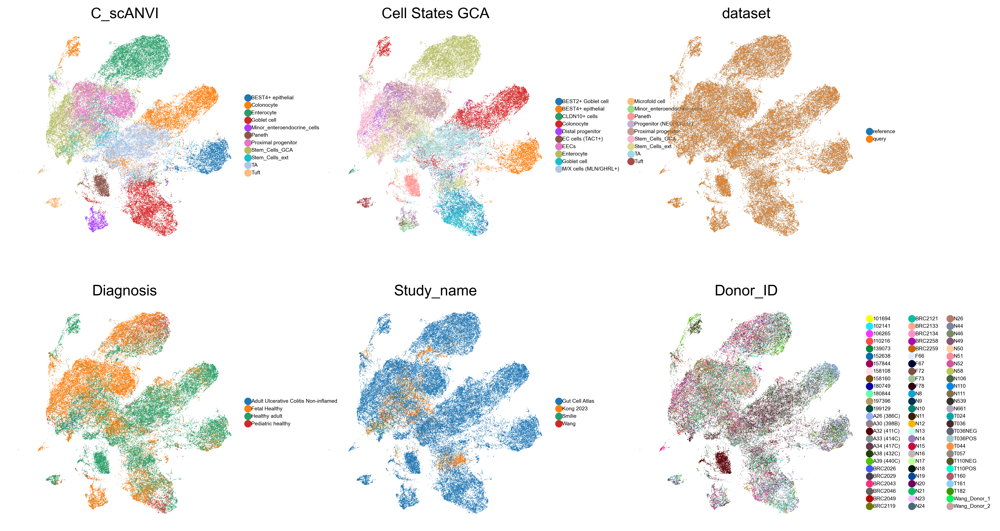

In [36]:
sc.pl.umap(adata, frameon = False, color = ['C_scANVI', 'Cell States GCA', 'dataset', 'Diagnosis', 'Study_name', 'Donor_ID'], size = 0.6, legend_fontsize = 5, ncols = 3)

In [37]:
#Write anndata object to file - local machine path
adata.write_h5ad('/Users/anna.maguza/Desktop/Data/Processed_datasets/post_SCANVI/Epithelial/Epithelial_cells_after_scanvi_with_Kong_3K_HVGs_Donor_and_Sample_batch.h5ad')

### Models Validation

In [ ]:
input_file = '/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/expi_map/Epithelial_cells_after_scanvi2.h5ad'
output_file = '/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/expi_map/Epithelial_cells_after_scanvi_output.h5ad'
adata = sc.read_h5ad(input_file)

In [38]:
adata.obs['C_scANVI'].value_counts()

TA                             22484
Colonocyte                     21024
Enterocyte                     20794
Stem_Cells_GCA                 20638
Proximal progenitor            20132
Goblet cell                    16120
BEST4+ epithelial               9680
Paneth                          4798
Stem_Cells_ext                  4578
Minor_enteroendocrine_cells     3510
Tuft                            1566
Name: C_scANVI, dtype: int64

In [39]:
adata.obs['Cell States GCA'].value_counts()

TA                             20000
Colonocyte                     20000
Enterocyte                     20000
Proximal progenitor            17160
Stem_Cells_ext                 13818
Stem_Cells_GCA                 13818
BEST4+ epithelial               8800
Goblet cell                     7930
BEST2+ Goblet cell              5850
Paneth                          5822
Distal progenitor               5550
Tuft                            1376
Minor_enteroendocrine_cells     1258
Microfold cell                   860
EC cells (TAC1+)                 774
EECs                             742
Progenitor (NEUROG3+)            584
M/X cells (MLN/GHRL+)            536
CLDN10+ cells                    446
Name: Cell States GCA, dtype: int64

Text(0, 0.5, 'Observed')

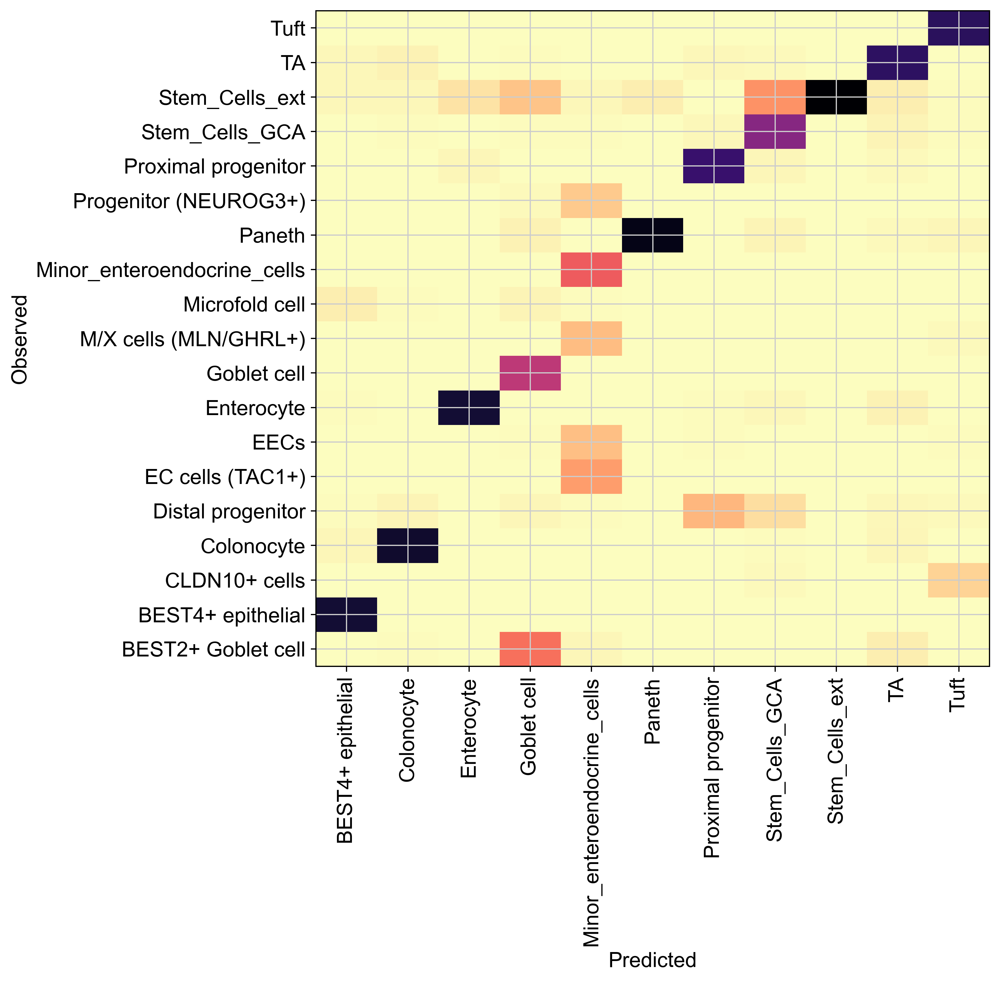

In [40]:
#Validation of the clusters
df = adata.obs.groupby(['Cell States GCA', "C_scANVI"]).size().unstack(fill_value=0)
norm_df = df / df.sum(axis=0)

plt.figure(figsize=(8, 8))
_ = plt.pcolor(norm_df)
_ = plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xlabel("Predicted")
plt.ylabel("Observed")

In [41]:
#Calculate accuracy
print(f"Acc: {np.mean(adata.obs['Cell States GCA'].cat.codes == adata.obs.C_scANVI.cat.codes)}")

Acc: 0.0033029644105584764
